# DIP Assignment 1

Arghya Roy (2021115008)


### Imports

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Question 1

### Lenna's Plight

Help Lenna by reducing the size of her image by quantizing it in `n` (1-8) number of bits and discussing the effects of this quantization by plotting the new images. Her original image is in the attached `src_img` folder. 

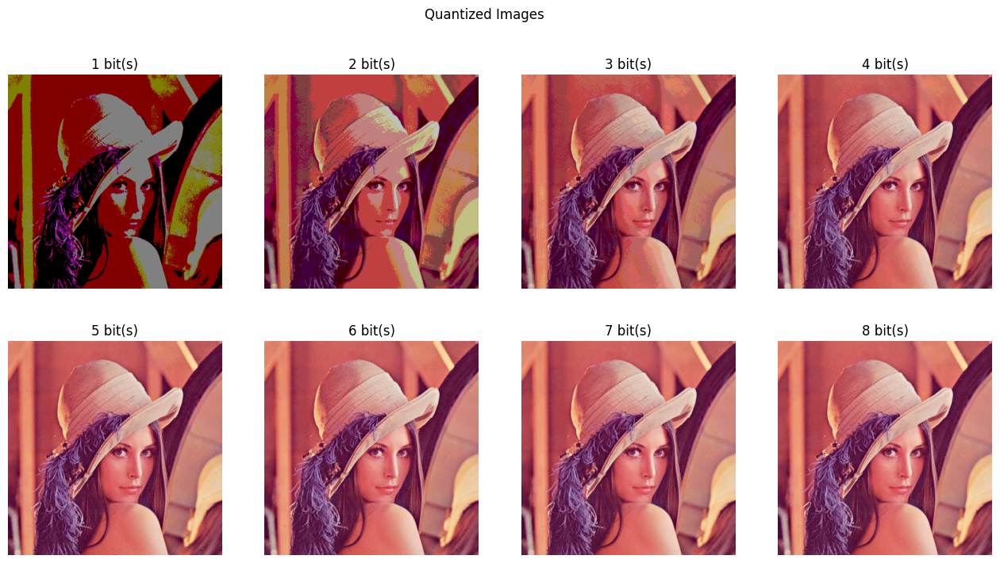

In [2]:
def quantize_image(image, n):
    uniques = 2**n
    return (image // (256 // uniques)) * (256 // uniques)

image = cv2.imread('src_img/Lenna.png')
fig, axs = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('Quantized Images')
for i in range(8):
    n = i + 1
    new_image = quantize_image(image, n)
    axs[i//4, i%4].imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))
    axs[i//4, i%4].set_title(f'{n} bit(s)')
    axs[i//4, i%4].axis('off')
    cv2.imwrite(f'out_img/1/quantized_{n}bit.png', new_image)
plt.show()

#### Explanation

In this quantization process, we are reducing the number of bits used to represent the image, which is thus useful for reducing the size. However, as the number of bits decreases, the image loses fine details and color variations, leading to a trade-off between memory efficiency and image quality.

On applying bit quantization to the Lenna image with varying numbers of bits (1-8 bits) it can be observed that as the number of bits decreases, there is a significant reduction in color levels and overall detail in the quantised image. The result is a gradual loss of smooth gradients, and instead, we observe flatter regions with fewer distinguishable colors. 

---

## Question 2

Sorry, this is a long one

### Subtask 1

Write a `histequalize()` function that can be used to equalize the histogram of an image that is passed to it


In [3]:
def histequalize(image):
    b_channel, g_channel, r_channel = cv2.split(image)
    hist_b, bins_b = np.histogram(b_channel.flatten(), bins=256, range=[0, 256])
    hist_g, bins_g = np.histogram(g_channel.flatten(), bins=256, range=[0, 256])
    hist_r, bins_r = np.histogram(r_channel.flatten(), bins=256, range=[0, 256])

    hist = hist_b + hist_g + hist_r
    cdf = hist.cumsum()
    cdf_norm = ((cdf - cdf.min()) * 255) / (cdf.max() - cdf.min())
    cdf_norm = cdf_norm.astype("uint8")
    b_new = cdf_norm[b_channel]
    g_new = cdf_norm[g_channel]
    r_new = cdf_norm[r_channel]
    equalized_image = cv2.merge((b_new, g_new, r_new))
    return equalized_image, b_new, g_new, r_new

### Subtask 2

In a single figure (3x2), plot A and B, their respective histograms, and their respective equalized histograms using the `histequalize()` function you have written. Comment on whether this is good representation for a colored image’s histogram

In [4]:

def plot_combined_histogram(b_channel, g_channel, r_channel, ax, title):
    hist_b, bins_b = np.histogram(b_channel.flatten(), bins=256, range=[0, 256])
    hist_g, bins_g = np.histogram(g_channel.flatten(), bins=256, range=[0, 256])
    hist_r, bins_r = np.histogram(r_channel.flatten(), bins=256, range=[0, 256])

    combined_hist = hist_b + hist_g + hist_r

    ax.plot(combined_hist, color="black")
    ax.set_xlim([0, 256])
    ax.set_title(title)

In [5]:
image_a = cv2.imread("src_img/lenna.png")
image_b = cv2.imread("src_img/image.jpg")

b_channel_a, g_channel_a, r_channel_a = cv2.split(image_a)
b_channel_b, g_channel_b, r_channel_b = cv2.split(image_b)

equalized_image_a, b_equalized_a, g_equalized_a, r_equalized_a = histequalize(image_a)
equalized_image_b, b_equalized_b, g_equalized_b, r_equalized_b = histequalize(image_b)

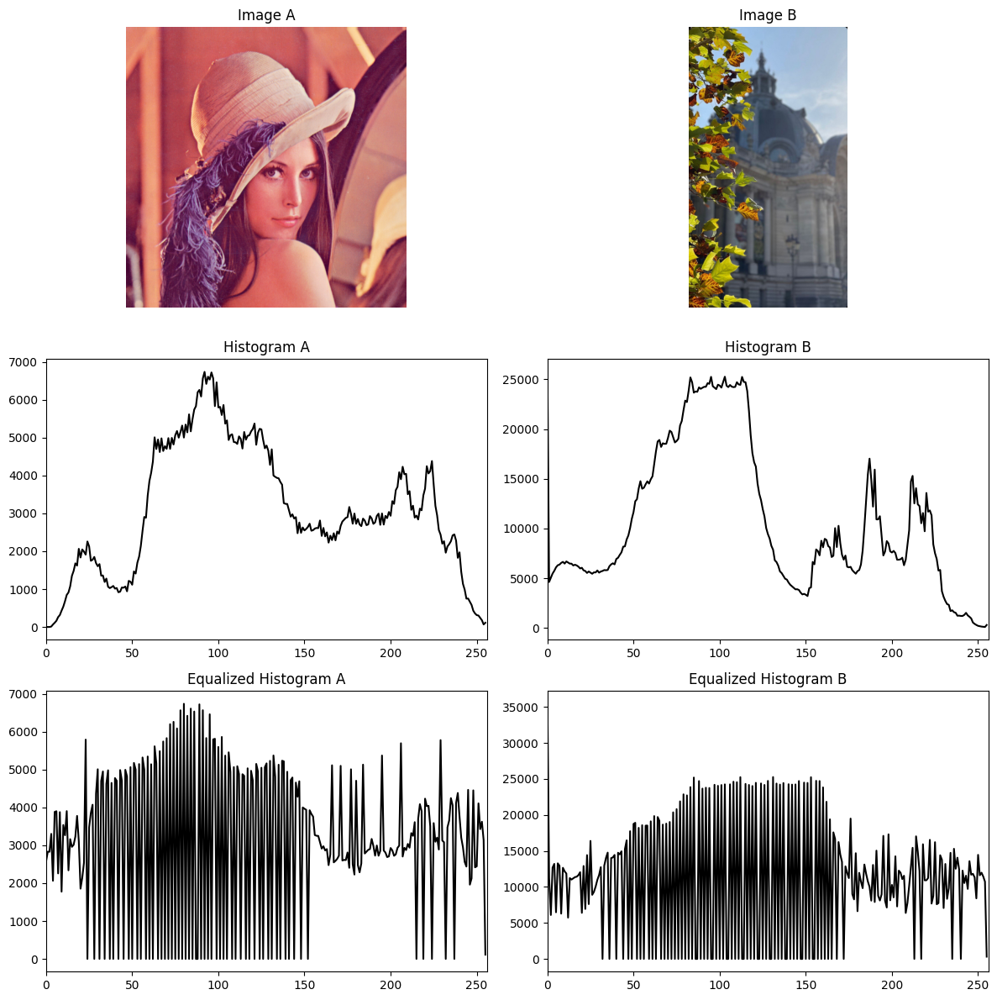

In [6]:
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

axs[0, 0].imshow(cv2.cvtColor(image_a, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title("Image A")
axs[0, 0].axis("off")
plot_combined_histogram(b_channel_a, g_channel_a, r_channel_a, axs[1, 0], "Histogram A")
plot_combined_histogram(b_equalized_a, g_equalized_a, r_equalized_a, axs[2, 0], "Equalized Histogram A")
cv2.imwrite("out_img/2/equalized_image_a.png", equalized_image_a)

axs[0, 1].imshow(cv2.cvtColor(image_b, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title("Image B")
axs[0, 1].axis("off")
plot_combined_histogram(b_channel_b, g_channel_b, r_channel_b, axs[1, 1], "Histogram B")
plot_combined_histogram(b_equalized_b, g_equalized_b, r_equalized_b, axs[2, 1], "Equalized Histogram B")
cv2.imwrite("out_img/2/equalized_image_b.png", equalized_image_b)


plt.tight_layout()
plt.show()

#### Comment

The histograms and equalized histograms above show the intensity distribution of Images A and B irrespective of color. While histogram equalization is a great tool for enhancing contrast in grayscale images, it's not the best way to represent the richness of colored images. This is because color images are made up of three different channels (Red, Green, Blue), and equalizing a combined grayscale version can mess with the image’s natural colors and lead to a loss of detail.

For color images, a better approach would be to apply histogram equalization separately to each color channel. This keeps the colors balanced and avoids any weird shifts. So, the method shown here might not be the most effective for truly representing colored images.

#### Subtask 3

In a single figure (3x3) plot the separate RGB channels of A, the histograms of these respective channels, and the equalized histograms of these respective channels. Do the same for B (in a separate figure)

In [7]:
def channelHistogramEqualization(channel):
    hist, bins = np.histogram(channel.flatten(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_norm = ((cdf - cdf.min()) * 255) / (cdf.max() - cdf.min())
    cdf_norm = cdf_norm.astype("uint8")
    channel_new = cdf_norm[channel]
    return channel_new


def histequalize_ch(image):

    b_channel, g_channel, r_channel = cv2.split(image)
    b_equalized = channelHistogramEqualization(b_channel)
    g_equalized = channelHistogramEqualization(g_channel)
    r_equalized = channelHistogramEqualization(r_channel)
    equalized_image = cv2.merge((b_equalized, g_equalized, r_equalized))
    return equalized_image, b_equalized, g_equalized, r_equalized

In [8]:
def plot_histogram_channel(channel, ax, title):
    hist, bins = np.histogram(channel.flatten(), bins=256, range=[0, 256])
    ax.plot(hist, color="black")
    ax.set_xlim([0, 256])
    ax.set_title(title)

In [9]:
ch_equalized_image_a, ch_b_equalized_a, ch_g_equalized_a, ch_r_equalized_a = histequalize_ch(image_a)
ch_equalized_image_b, ch_b_equalized_b, ch_g_equalized_b, ch_r_equalized_b = histequalize_ch(image_b)

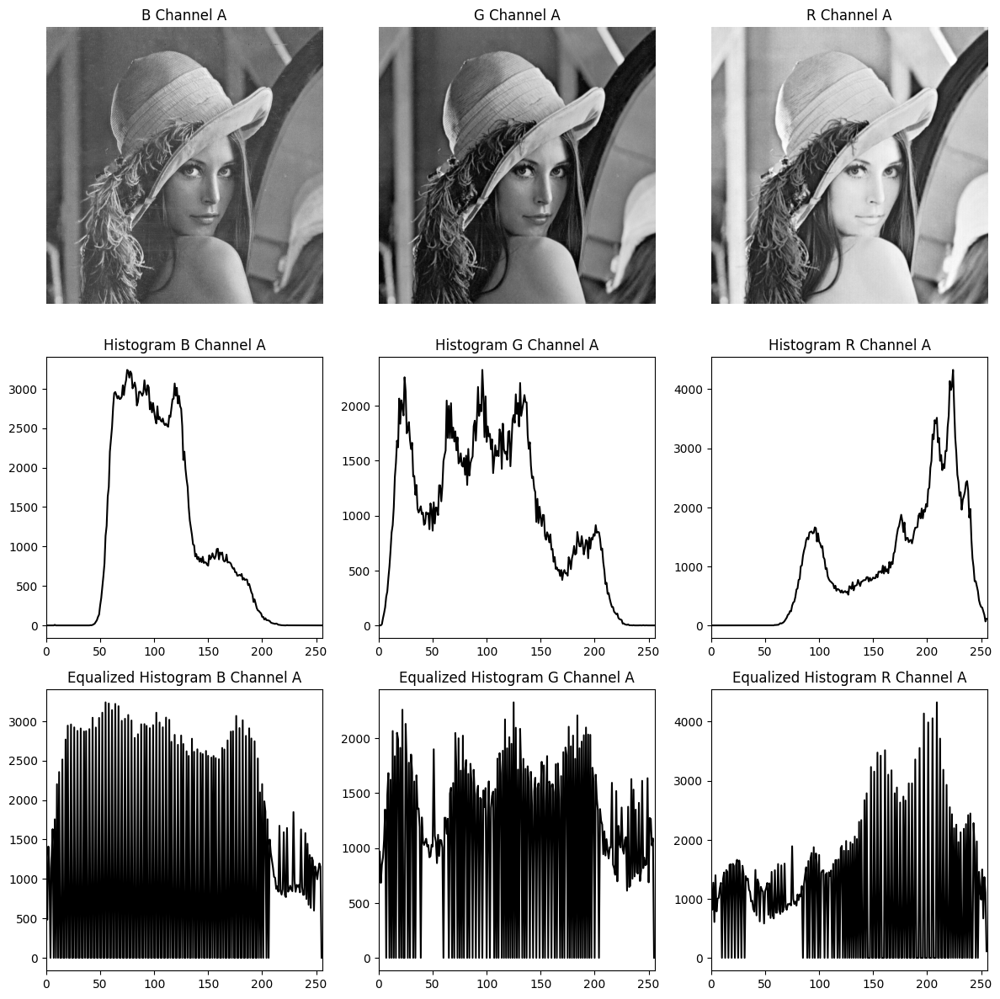

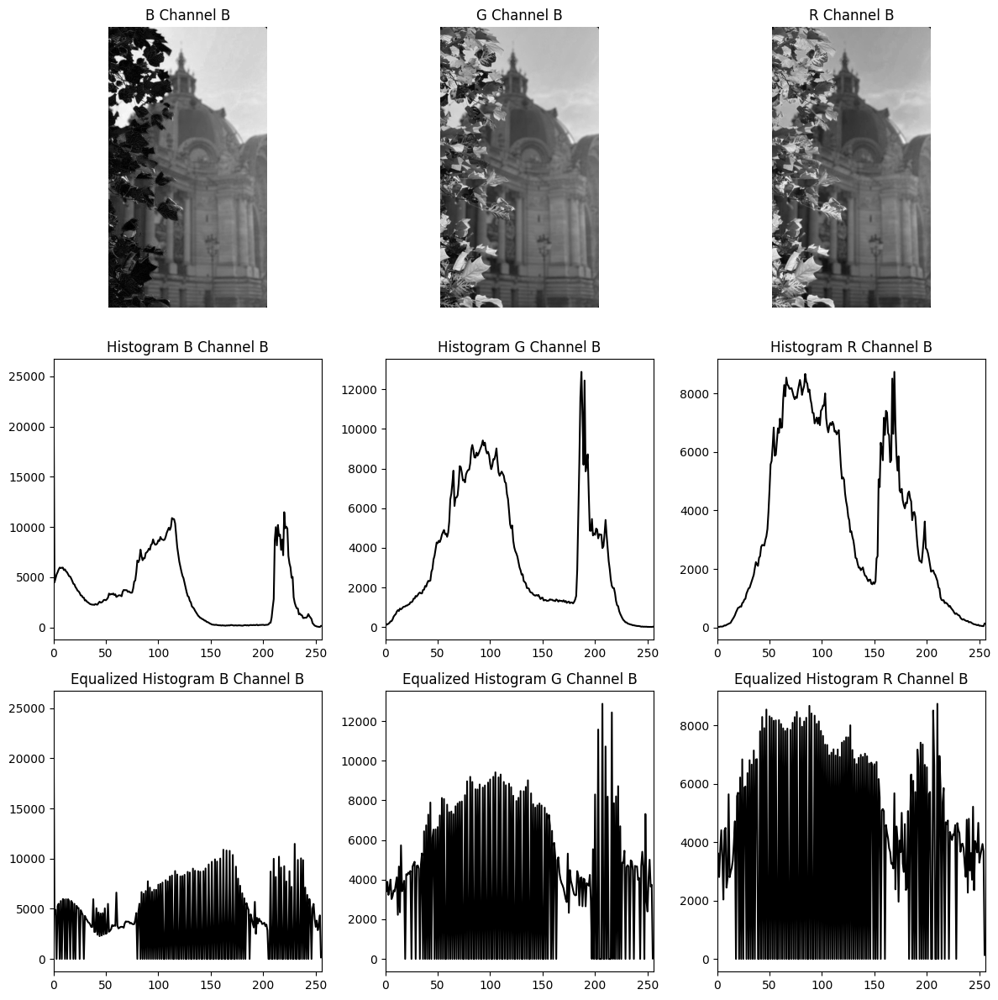

In [10]:
fig_a, axs_a = plt.subplots(3, 3, figsize=(12, 12))

axs_a[0, 0].imshow(b_channel_a, cmap="gray")
axs_a[0, 0].set_title("B Channel A")
axs_a[0, 0].axis("off")
plot_histogram_channel(b_channel_a, axs_a[1, 0], "Histogram B Channel A")
plot_histogram_channel(
    ch_b_equalized_a,
    axs_a[2, 0],
    "Equalized Histogram B Channel A",
)

axs_a[0, 1].imshow(g_channel_a, cmap="gray")
axs_a[0, 1].set_title("G Channel A")
axs_a[0, 1].axis("off")
plot_histogram_channel(g_channel_a, axs_a[1, 1], "Histogram G Channel A")
plot_histogram_channel(
    ch_g_equalized_a,
    axs_a[2, 1],
    "Equalized Histogram G Channel A",
)

axs_a[0, 2].imshow(r_channel_a, cmap="gray")
axs_a[0, 2].set_title("R Channel A")
axs_a[0, 2].axis("off")
plot_histogram_channel(r_channel_a, axs_a[1, 2], "Histogram R Channel A")
plot_histogram_channel(
    ch_r_equalized_a,
    axs_a[2, 2],
    "Equalized Histogram R Channel A",
)

fig_a.tight_layout()
plt.show()

fig_b, axs_b = plt.subplots(3, 3, figsize=(12, 12))

axs_b[0, 0].imshow(b_channel_b, cmap="gray")
axs_b[0, 0].set_title("B Channel B")
axs_b[0, 0].axis("off")
plot_histogram_channel(b_channel_b, axs_b[1, 0], "Histogram B Channel B")
plot_histogram_channel(
    ch_b_equalized_b,
    axs_b[2, 0],
    "Equalized Histogram B Channel B",
)

axs_b[0, 1].imshow(g_channel_b, cmap="gray")
axs_b[0, 1].set_title("G Channel B")
axs_b[0, 1].axis("off")
plot_histogram_channel(g_channel_b, axs_b[1, 1], "Histogram G Channel B")
plot_histogram_channel(
    ch_g_equalized_b,
    axs_b[2, 1],
    "Equalized Histogram G Channel B",
)

axs_b[0, 2].imshow(r_channel_b, cmap="gray")
axs_b[0, 2].set_title("R Channel B")
axs_b[0, 2].axis("off")
plot_histogram_channel(r_channel_b, axs_b[1, 2], "Histogram R Channel B")
plot_histogram_channel(
    ch_r_equalized_b,
    axs_b[2, 2],
    "Equalized Histogram R Channel B",
)

fig_b.tight_layout()
plt.show()

### Subtask 4

In a single figure (1x3) plot the separate RGB channels of A, after histogram equalization is performed. Do the same for B (in a separate figure)

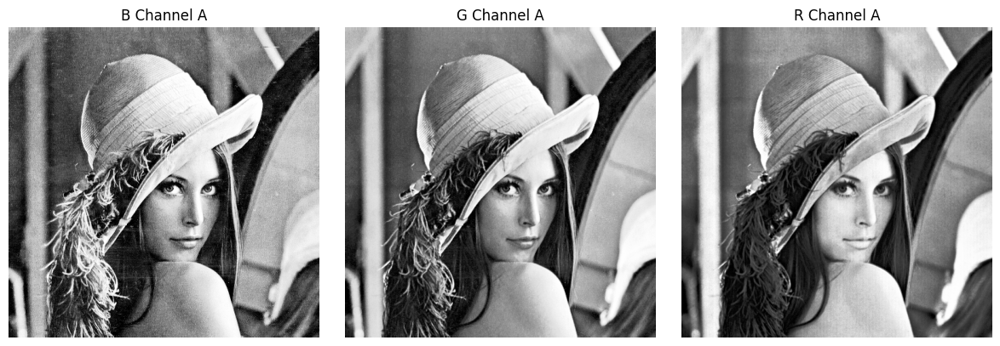

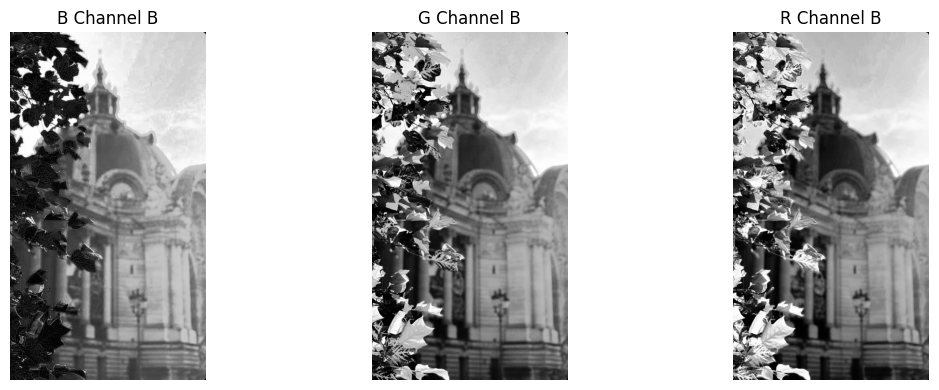

In [11]:
fig_a, axs_a = plt.subplots(1, 3, figsize=(12, 4))

axs_a[0].imshow(ch_b_equalized_a, cmap="gray")
axs_a[0].set_title("B Channel A")
axs_a[0].axis("off")

axs_a[1].imshow(ch_g_equalized_a, cmap="gray")
axs_a[1].set_title("G Channel A")
axs_a[1].axis("off")

axs_a[2].imshow(ch_r_equalized_a, cmap="gray")
axs_a[2].set_title("R Channel A")
axs_a[2].axis("off")

fig_a.tight_layout()
plt.show()

fig_b, axs_b = plt.subplots(1, 3, figsize=(12, 4))

axs_b[0].imshow(ch_b_equalized_b, cmap="gray")
axs_b[0].set_title("B Channel B")
axs_b[0].axis("off")

axs_b[1].imshow(ch_g_equalized_b, cmap="gray")
axs_b[1].set_title("G Channel B")
axs_b[1].axis("off")

axs_b[2].imshow(ch_r_equalized_b, cmap="gray")
axs_b[2].set_title("R Channel B")
axs_b[2].axis("off")

fig_b.tight_layout()
plt.show()

### Subtask 5

In a single figure (2x2) plot A and B (after merging the equalized channels) and plot their respective histograms.

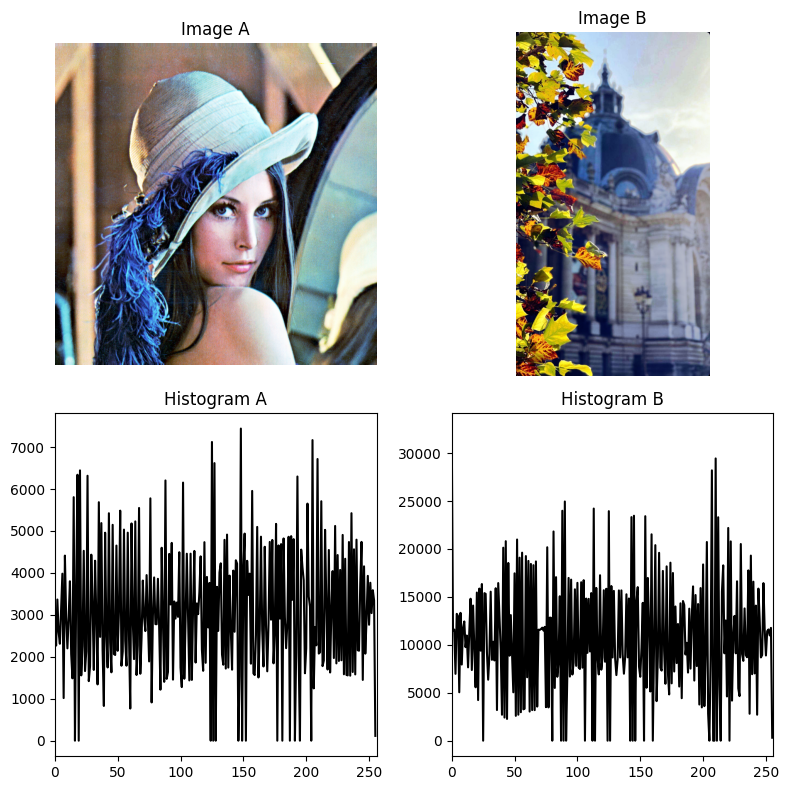

In [12]:
fig, axs = plt.subplots(2, 2, figsize=(8, 8))

axs[0, 0].imshow(cv2.cvtColor(ch_equalized_image_a, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title("Image A")
axs[0, 0].axis("off")
plot_combined_histogram(ch_b_equalized_a, ch_g_equalized_a, ch_r_equalized_a, axs[1, 0], "Histogram A")
cv2.imwrite("out_img/2/channelwise_equalized_image_a.png", ch_equalized_image_a)

axs[0, 1].imshow(cv2.cvtColor(ch_equalized_image_b, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title("Image B")
axs[0, 1].axis("off")
plot_combined_histogram(ch_b_equalized_b, ch_g_equalized_b, ch_r_equalized_b, axs[1, 1], "Histogram B")
cv2.imwrite("out_img/2/channelwise_equalized_image_b.png", ch_equalized_image_b)

fig.tight_layout()
plt.show()

### Subtask 6

Concatenate the equalized respective RGB histograms for A and B that you had in subtask-3. Plot these in a single figure (2x2) along with a graph (for A and B both) that demonstrates the difference between the equalized histogram you had in subtask-5 and the concatenated histogram

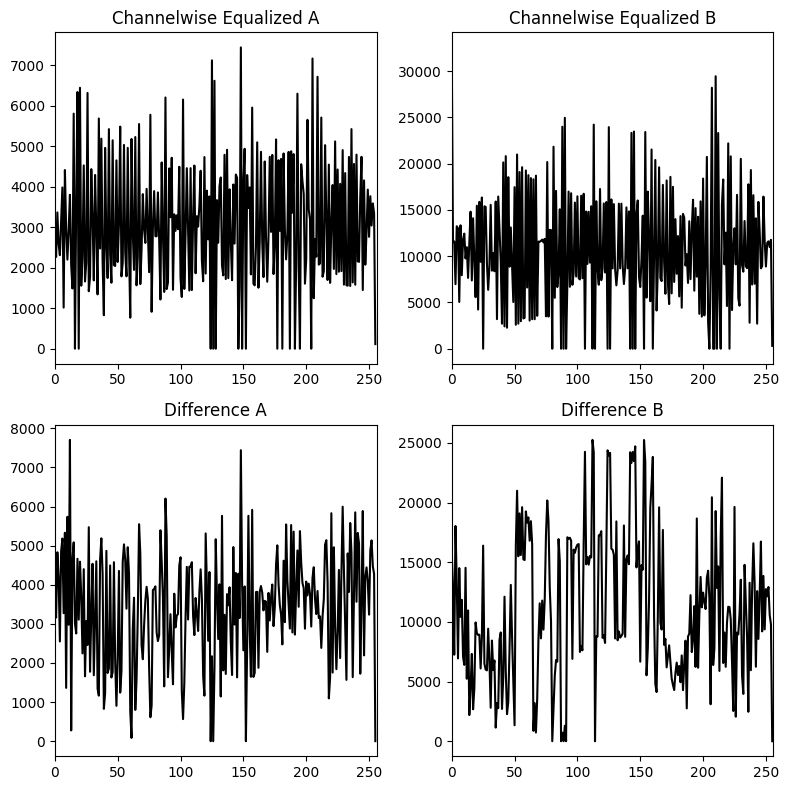

In [16]:
def plot_hist(hist_b, hist_g, hist_r, ax, title):
    combined_hist = hist_b + hist_g + hist_r

    ax.plot(combined_hist, color="black")
    ax.set_xlim([0, 256])
    ax.set_title(title)

fig, axs = plt.subplots(2, 2, figsize=(8, 8))

ch_eq_hist_b_a, bins = np.histogram(ch_b_equalized_a.flatten(), bins=256, range=[0, 256])
ch_eq_hist_g_a, bins = np.histogram(ch_g_equalized_a.flatten(), bins=256, range=[0, 256])
ch_eq_hist_r_a, bins = np.histogram(ch_r_equalized_a.flatten(), bins=256, range=[0, 256])

ch_eq_hist_b_b, bins = np.histogram(ch_b_equalized_b.flatten(), bins=256, range=[0, 256])
ch_eq_hist_g_b, bins = np.histogram(ch_g_equalized_b.flatten(), bins=256, range=[0, 256])
ch_eq_hist_r_b, bins = np.histogram(ch_r_equalized_b.flatten(), bins=256, range=[0, 256])

eq_hist_b_a, bins= np.histogram(b_equalized_a.flatten(), bins=256, range=[0, 256])
eq_hist_g_a, bins= np.histogram(g_equalized_a.flatten(), bins=256, range=[0, 256])
eq_hist_r_a, bins= np.histogram(r_equalized_a.flatten(), bins=256, range=[0, 256])

eq_hist_b_b, bins= np.histogram(b_equalized_b.flatten(), bins=256, range=[0, 256])
eq_hist_g_b, bins= np.histogram(g_equalized_b.flatten(), bins=256, range=[0, 256])
eq_hist_r_b, bins= np.histogram(r_equalized_b.flatten(), bins=256, range=[0, 256])

diff_eq_b_a = np.abs(eq_hist_b_a - ch_eq_hist_b_a)
diff_eq_g_a = np.abs(eq_hist_g_a - ch_eq_hist_g_a)
diff_eq_r_a = np.abs(eq_hist_r_a - ch_eq_hist_r_a)

diff_eq_b_b = np.abs(eq_hist_b_b - ch_eq_hist_b_b)
diff_eq_g_b = np.abs(eq_hist_g_b - ch_eq_hist_g_b)
diff_eq_r_b = np.abs(eq_hist_r_b - ch_eq_hist_r_b)

plot_hist(ch_eq_hist_b_a, ch_eq_hist_g_a, ch_eq_hist_r_a, axs[0, 0], "Channelwise Equalized A")
plot_hist(ch_eq_hist_b_b, ch_eq_hist_g_b, ch_eq_hist_r_b, axs[0, 1], "Channelwise Equalized B")

plot_hist(diff_eq_b_a, diff_eq_g_a, diff_eq_r_a, axs[1, 0], "Difference A")
plot_hist(diff_eq_b_b, diff_eq_g_b, diff_eq_r_b, axs[1, 1], "Difference B")

fig.tight_layout()
plt.show()

### Subtask 7

Lastly, comment on your work and what you may have learnt from these subtasks as a whole, in not more than 50 words

This assignment deepened my understanding of histogram equalization and its impact on both grayscale and color images. By applying it across RGB channels, I learned how to preserve color balance and gained insights into the importance of channel-specific processing in image enhancement. Among other things, this assignment helped me understand the difference between overall and channel-wise histogram equalization. 

---

## Question 3

Who’s the Best?

### Subtask 1

Pick up the cryptic photo titled as ‘X_mod.png’ where X is the last digit of your Roll Number and extract the cryptic image from it. Plot this cryptic image.

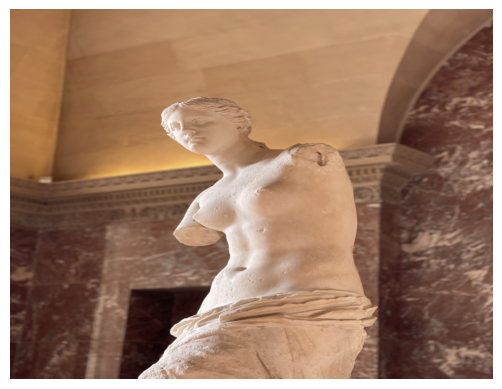

In [16]:
x = 8

image = cv2.imread(f"src_img/{x}_mod.png")

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

### Subtask 2

Who is the best? Especially whom?

#### Answer

DIP TAs, especially Noor

### Subtask 3

Can you explain why the cryptic image was weirdly proportioned?

#### Answer

This is because the message image is of dimensions 1672 x 1280. So, the base image was forcefully resized for compatibilty, hence looking weirdly proportioned.

### Subtask 4

Using your past experience with helping Lenna (in Question-1) can you explain how the cryptic image was created?

#### Answer:

LSB (Least Significant Bit) image encryption has been done here for hiding a message within an image. It involves modifying the least significant bits of the pixel values in a base image to embed the information from a message image. Since the changes in the LSB are minimal, they are generally not visible to the human eye, allowing the base image to appear nearly identical to its original form.

Exact process:
- Set the LSB of each pixel of base image to zero (can be done by doing bitwise AND operation with 0b11111110)
- Shift the MSB of the message image to the LSB (can be done by right shifting by 7)
- Merge the shifted message pixel of the message image into the previously cleared LSB of the base image (can be done using bitwise OR) 

### Subtask 5

Write your own `crypt()` function that takes two color images, a message image and a base image, and embeds the message image in the base image (as done for cryptic images above). Plot the base image and the encrypted image side-by-side

In [53]:
def crypt(base_image, message_image):
    base = cv2.imread(base_image)
    message = cv2.imread(message_image)
    if message.shape[0] > base.shape[0] or message.shape[1] > base.shape[1]:
        raise ValueError("Message image is larger than the base image.")
    base = cv2.resize(base, (message.shape[1], message.shape[0]))

    # base = base & 0b11111110
    base = base & 0b11111000
    # encrypted_img = base | (message_img_resized >> 7)
    encrypted_img = base | (message >> 5)
    return encrypted_img

In [54]:
def plot_images(base_image_path, encrypted_image):
    base_img = cv2.imread(base_image_path)

    base_img_rgb = cv2.cvtColor(base_img, cv2.COLOR_BGR2RGB)
    encrypted_img_rgb = cv2.cvtColor(encrypted_image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(base_img_rgb)
    plt.title("Base Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(encrypted_img_rgb)
    plt.title("Encrypted Image")
    plt.axis('off')

    plt.show()

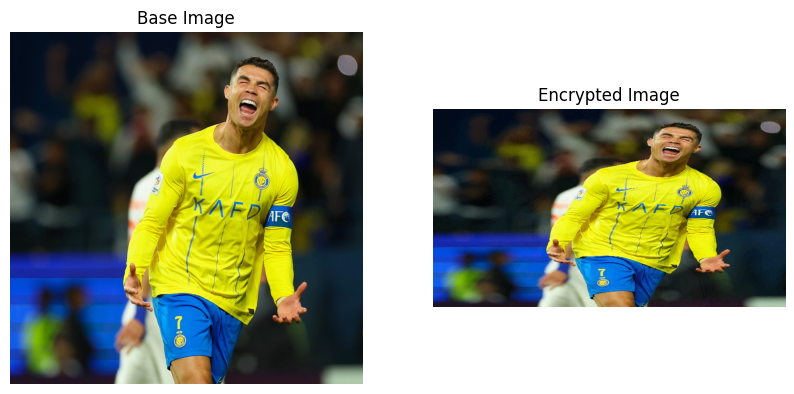

True

In [55]:
crypt_img = crypt('src_img/base.jpeg', 'src_img/hidden.jpg')

plot_images(f'src_img/base.jpeg', crypt_img)
cv2.imwrite('out_img/3/encrypted.png',crypt_img)

### Subtask 6

Lastly, write your own `decrypt()` function that can extract a visual message from the kind of encrypted images that your `crypt()` function generates

In [56]:
def decrypt(encrypted_image):
    code=cv2.imread(encrypted_image)
    return (code & 0b00000111) << 5

def decrypt_1bit(encrypted_image):
    code=cv2.imread(encrypted_image)
    return (code & 1) * 255

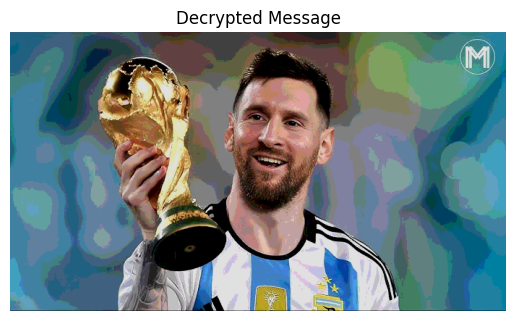

True

In [57]:
encrypted_image='out_img/3/encrypted.png'
decrypted_message = decrypt(encrypted_image)

plt.imshow(cv2.cvtColor(decrypted_message, cv2.COLOR_BGR2RGB))
plt.title("Decrypted Message")
plt.axis('off')

plt.show()
cv2.imwrite(f'out_img/3/decrypted.png', decrypted_message)

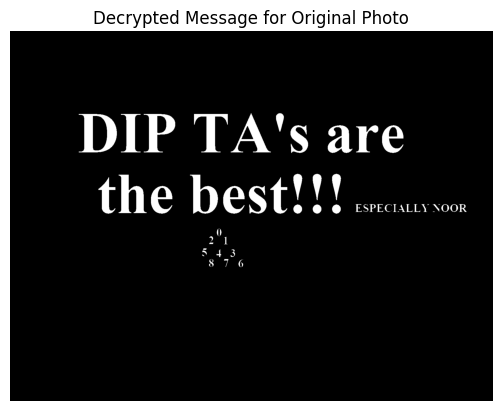

True

In [26]:
encrypted_image=f'src_img/{x}_mod.png'
decrypted_message = decrypt_1bit(encrypted_image)

plt.imshow(cv2.cvtColor(decrypted_message, cv2.COLOR_BGR2RGB))
plt.title("Decrypted Message for Original Photo")
plt.axis('off')

plt.show()
cv2.imwrite(f'out_img/3/decrypted_{x}_mod.png', decrypted_message)

---

## Question 4

It just doesn’t end, does it

### Subtask 1

Apply the Linear Piece-wise transformations and in a single figure (2x2) plot the original images as well as the transformed images

In [84]:
a = 8


def red_transform(channel):
    channel = channel.astype(np.int32)
    channel_new = np.where(
        channel <= 100, channel + a, np.where(channel <= 200, channel / a + 2 * a, 255)
    )
    return np.clip(channel_new, 0, 255).astype(np.uint8)


def green_transform(channel):
    channel = channel.astype(np.int32)
    channel_new = np.where(channel <= 128, 5 * channel + 1, a / channel + 8)
    return np.clip(channel_new, 0, 255).astype(np.uint8)


def blue_transform(channel):
    channel = channel.astype(np.int32)
    channel_new = np.where(channel <= 75, 255, np.where(channel <= 200, channel, 0))
    return np.clip(channel_new, 0, 255).astype(np.uint8)

In [85]:
image_a = cv2.imread("src_img/lenna.png")
image_b = cv2.imread("src_img/image.jpg")

b_channel_a, g_channel_a, r_channel_a = cv2.split(image_a)
b_channel_b, g_channel_b, r_channel_b = cv2.split(image_b)

trans_r_a = red_transform(r_channel_a)
trans_g_a = green_transform(g_channel_a)
trans_b_a = blue_transform(b_channel_a)

trans_r_b = red_transform(r_channel_b)
trans_g_b = green_transform(g_channel_b)
trans_b_b = blue_transform(b_channel_b)

transformed_image_a = cv2.merge((trans_b_a, trans_g_a, trans_r_a))
transformed_image_b = cv2.merge((trans_b_b, trans_g_b, trans_r_b))

cv2.imwrite("out_img/4/transformed_image_a.png", transformed_image_a)
cv2.imwrite("out_img/4/transformed_image_b.png", transformed_image_b)


C:\Users\ARGHYA\AppData\Local\Temp\ipykernel_3736\731809234.py:14: RuntimeWarning: divide by zero encountered in divide
  channel_new = np.where(channel <= 128, 5 * channel + 1, a / channel + 8)


True

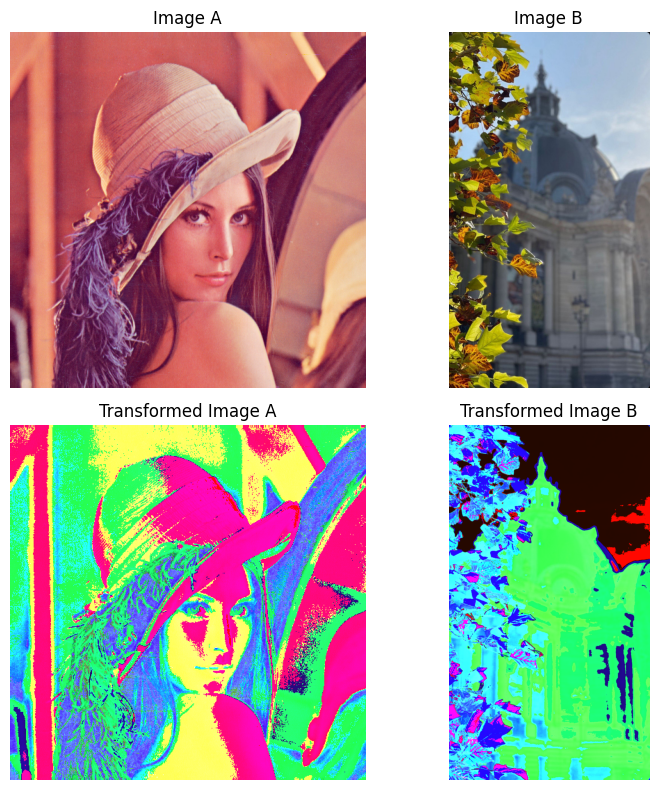

In [86]:
fig, axs = plt.subplots(2, 2, figsize=(8, 8))

axs[0, 0].imshow(cv2.cvtColor(image_a, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title("Image A")
axs[0, 0].axis("off")

axs[0, 1].imshow(cv2.cvtColor(image_b, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title("Image B")
axs[0, 1].axis("off")

axs[1, 0].imshow(cv2.cvtColor(transformed_image_a, cv2.COLOR_BGR2RGB))
axs[1, 0].set_title("Transformed Image A")
axs[1, 0].axis("off")

axs[1, 1].imshow(cv2.cvtColor(transformed_image_b, cv2.COLOR_BGR2RGB))
axs[1, 1].set_title("Transformed Image B")
axs[1, 1].axis("off")

fig.tight_layout()
plt.show()

### Subtask 2

Plot the transformations for the three separate channels of A and their line of best fit in a figure (3x1). Do the same for B (in a separate figure).

In [87]:
def calculate_best_fit_line(x, y):
    # x_mean = np.mean(x)
    # y_mean = np.mean(y)
    # num = np.sum((x - x_mean) * (y - y_mean))
    # denom = np.sum((x - x_mean) ** 2)
    # m = num / denom
    # c = y_mean - m * x_mean
    m, c = np.polyfit(x, y, 1)

    return m, c

In [88]:
def plot_channel_transformation(original_channel, transformed_channel, title):
    plt.scatter(
        original_channel.flatten(),
        transformed_channel.flatten(),
        alpha=0.3,
        label="Transformed Values",
        color="blue",
    )

    m, c = calculate_best_fit_line(
        original_channel.flatten(), transformed_channel.flatten()
    )
    plt.plot(
        original_channel.flatten(),
        m * original_channel.flatten() + c,
        color="red",
        label="Line of Best Fit",
    )

    plt.title(title)
    plt.xlabel("Original Values")
    plt.ylabel("Transformed Values")
    plt.legend()


C:\Users\ARGHYA\AppData\Local\Temp\ipykernel_3736\731809234.py:14: RuntimeWarning: divide by zero encountered in divide
  channel_new = np.where(channel <= 128, 5 * channel + 1, a / channel + 8)


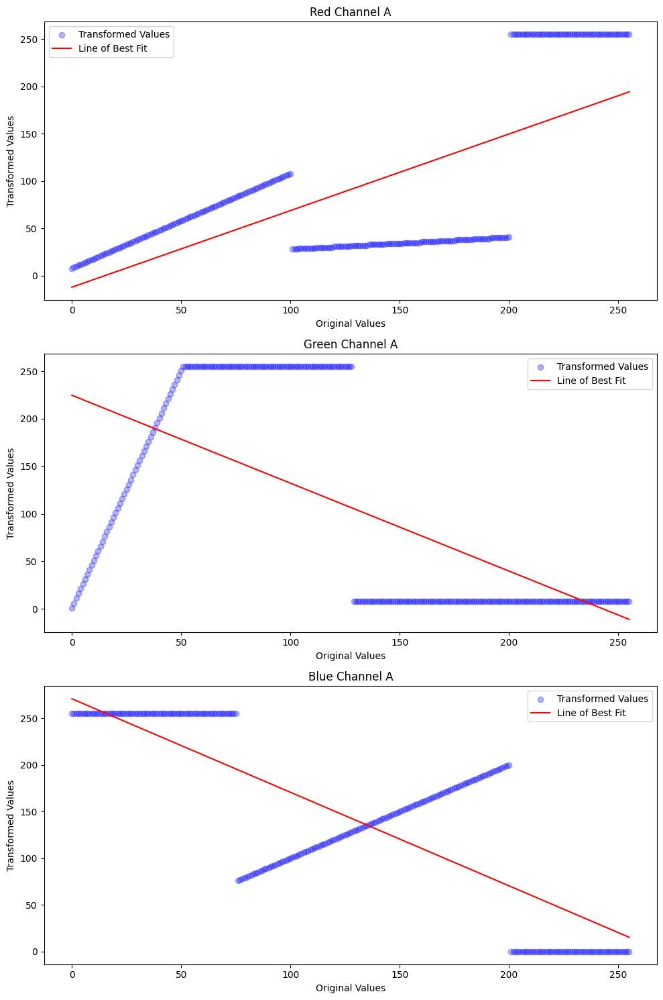

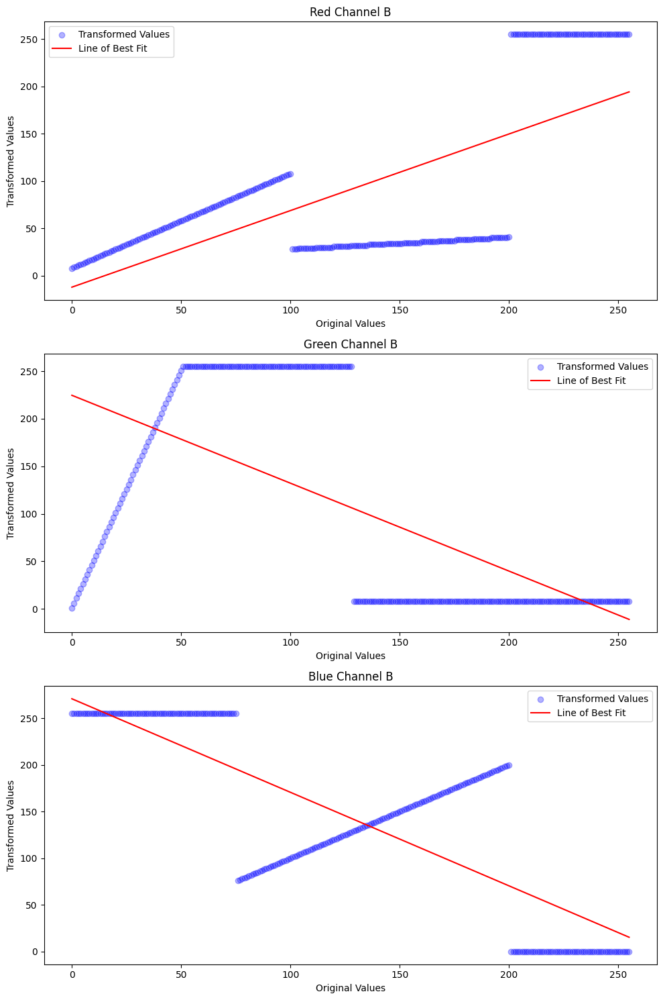

In [89]:
x = np.arange(0, 256)

plt.figure(figsize=(10, 15))

plt.subplot(3, 1, 1)
plot_channel_transformation(x, red_transform(x), "Red Channel A")

plt.subplot(3, 1, 2)
plot_channel_transformation(x, green_transform(x), "Green Channel A")

plt.subplot(3, 1, 3)
plot_channel_transformation(x, blue_transform(x), "Blue Channel A")

plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 15))

plt.subplot(3, 1, 1)
plot_channel_transformation(x, red_transform(x), "Red Channel B")

plt.subplot(3, 1, 2)
plot_channel_transformation(x, green_transform(x), "Green Channel B")

plt.subplot(3, 1, 3)
plot_channel_transformation(x, blue_transform(x), "Blue Channel B")

plt.tight_layout()
plt.show()

### Subtask 3

Read both A and transformed(A) and plot the input vs. output pixel intensities for the three separate channels along with a line of best fit in single figure (3x1). Do the same for B (in a separate figure). Also print the equation of the line of best fit for each channel. Explain what you see and why?

In [90]:
image_a = cv2.imread("src_img/lenna.png")
transformed_image_a = cv2.imread("out_img/4/transformed_image_a.png")

image_b = cv2.imread("src_img/image.jpg")
transformed_image_b = cv2.imread("out_img/4/transformed_image_b.png")

b_channel_a, g_channel_a, r_channel_a = cv2.split(image_a)
trans_b_channel_a, trans_g_channel_a, trans_r_channel_a = cv2.split(transformed_image_a)

b_channel_b, g_channel_b, r_channel_b = cv2.split(image_b)
trans_b_channel_b, trans_g_channel_b, trans_r_channel_b = cv2.split(transformed_image_b)

In [91]:
def plot_channel_intensity_comparison(
    original_channel, transformed_channel, channel_name
):
    original_values = original_channel.flatten()
    transformed_values = transformed_channel.flatten()

    plt.scatter(
        original_values, transformed_values, s=1, label=f"{channel_name} Channel"
    )

    slope, intercept = calculate_best_fit_line(original_values, transformed_values)

    predicted_values = slope * original_values + intercept

    plt.plot(
        original_values,
        predicted_values,
        color="red",
        label=f"Best Fit Line for {channel_name}",
    )

    plt.xlabel("Original Pixel Intensity")
    plt.ylabel("Transformed Pixel Intensity")
    plt.legend()

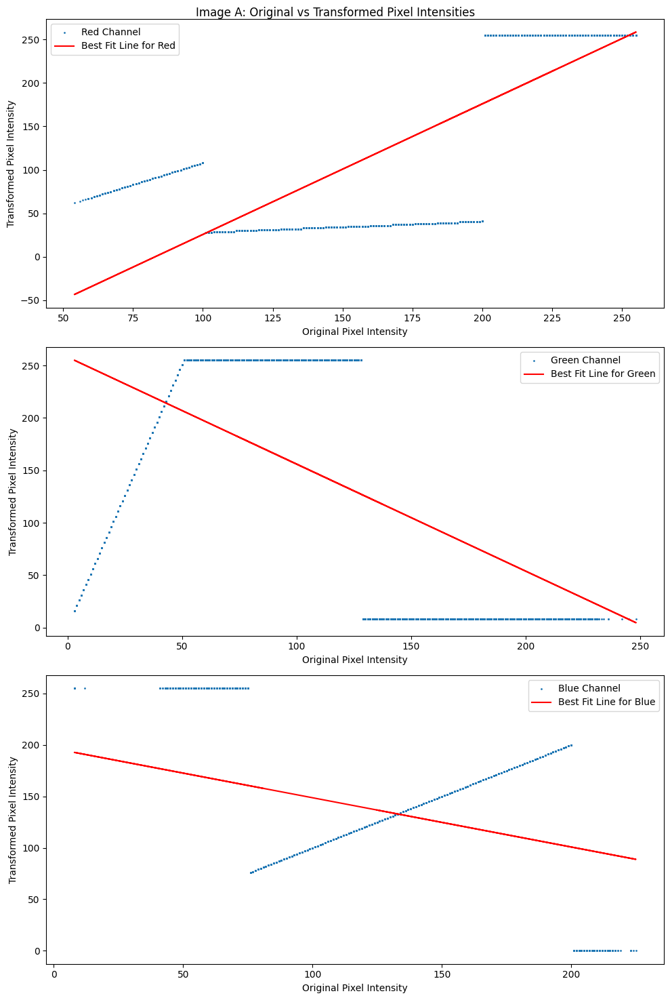

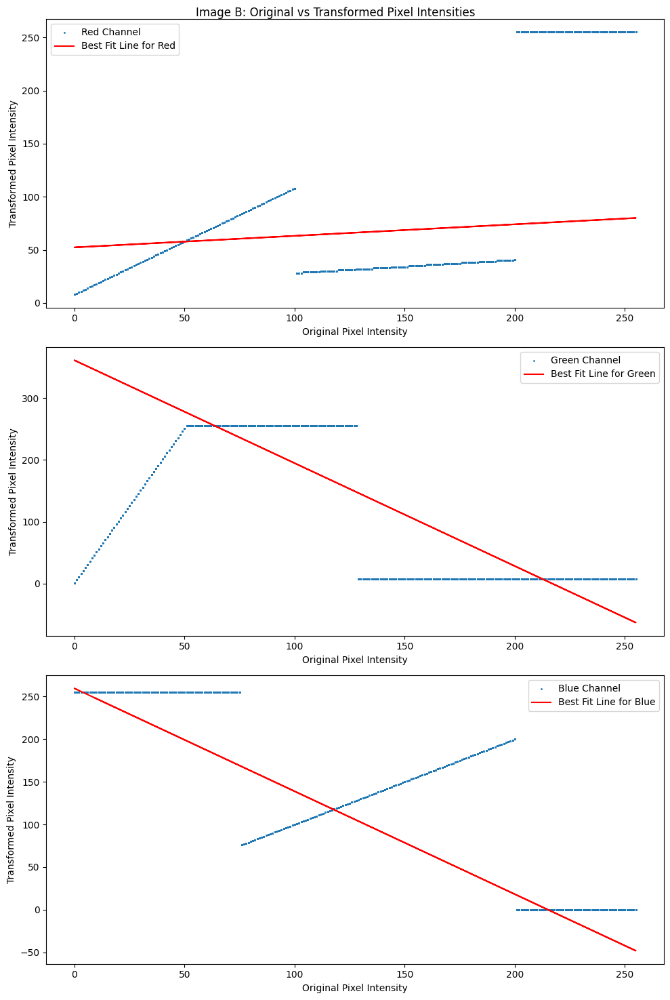

In [92]:
plt.figure(figsize=(10, 15))
plt.suptitle("Image A: Original vs Transformed Pixel Intensities")

plt.subplot(3, 1, 1)
plot_channel_intensity_comparison(r_channel_a, trans_r_channel_a, "Red")

plt.subplot(3, 1, 2)
plot_channel_intensity_comparison(g_channel_a, trans_g_channel_a, "Green")

plt.subplot(3, 1, 3)
plot_channel_intensity_comparison(b_channel_a, trans_b_channel_a, "Blue")

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 15))
plt.suptitle("Image B: Original vs Transformed Pixel Intensities")

plt.subplot(3, 1, 1)
plot_channel_intensity_comparison(r_channel_b, trans_r_channel_b, "Red")

plt.subplot(3, 1, 2)
plot_channel_intensity_comparison(g_channel_b, trans_g_channel_b, "Green")

plt.subplot(3, 1, 3)
plot_channel_intensity_comparison(b_channel_b, trans_b_channel_b, "Blue")

plt.tight_layout()
plt.show()

#### Explanation

1. Red Channel:
   - Image A: Shows a positive linear relationship, with the transformed intensity increasing as the original intensity increases.
   - Image B: Shows a slightly positive, almost flat linear relationship.

   This suggests that in Image A, the red channel has been enhanced, possibly to make red colors more prominent. In Image B, the red channel has been slightly adjusted but mostly preserved.

2. Green Channel:
   - Both images show a negative linear relationship, with the transformed intensity decreasing as the original intensity increases.
   - There are notable horizontal lines at the top and bottom of the plots, indicating clamping or thresholding effects.

   This inverse relationship suggests a color inversion effect on the green channel in both images, potentially creating a complementary color effect.

3. Blue Channel:
   - Both images show a negative linear relationship overall, but with some complexity.
   - There are horizontal lines and a positive slope section in the middle range of intensities.

   The blue channel has been inverted similarly to the green channel, but with additional transformations that create more complex effects in the mid-tones.

### Subtask 4

Now, plot all these aspects of the separate RGB channels in a single plot for three separate channel for 2 images (the input vs. output pixel intensities for A and transformed(A); its line of best fit; the line of best fit of the transformation equations themselves)

In [93]:
x = np.arange(0, 256)


def plot_line(color):
    if color == "red":
        y = red_transform(x)
    elif color == "green":
        y = green_transform(x)
    else:
        y = blue_transform(x)
    m, c = calculate_best_fit_line(x.flatten(), y.flatten())
    plt.plot(
        x.flatten(),
        m * x.flatten() + c,
        color="orange",
        label="Best Fit Line for Transformation itself",
    )
    plt.legend()

C:\Users\ARGHYA\AppData\Local\Temp\ipykernel_3736\731809234.py:14: RuntimeWarning: divide by zero encountered in divide
  channel_new = np.where(channel <= 128, 5 * channel + 1, a / channel + 8)


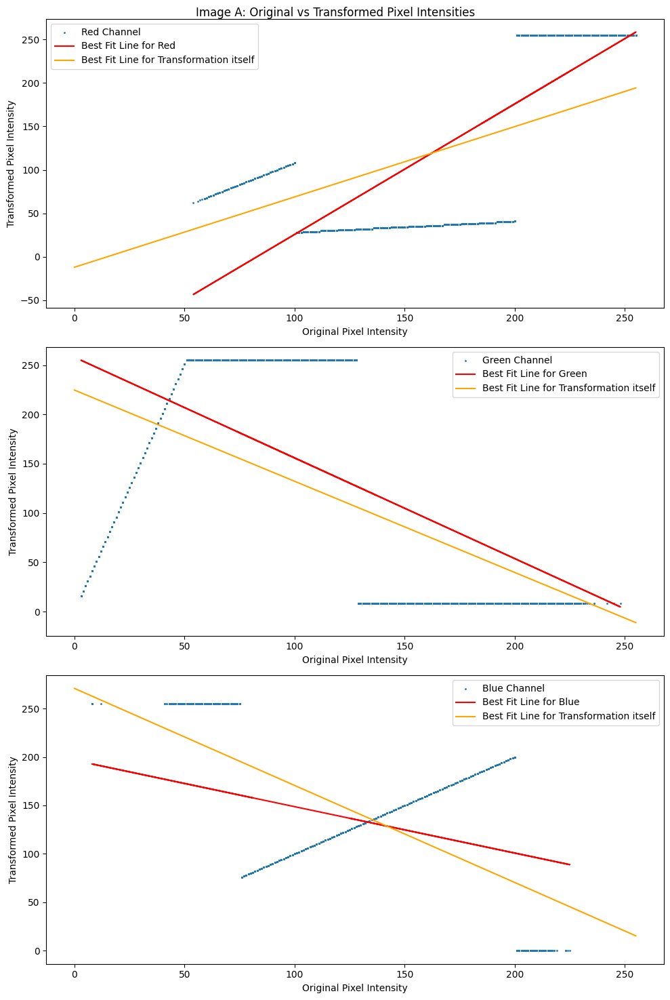

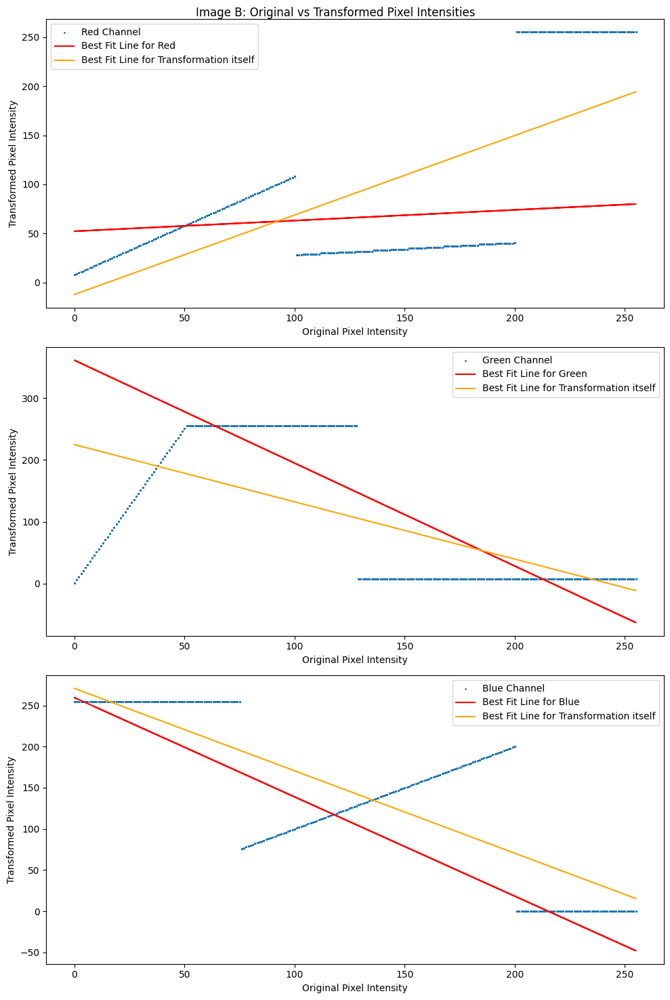

In [94]:
plt.figure(figsize=(10, 15))
plt.suptitle("Image A: Original vs Transformed Pixel Intensities")

plt.subplot(3, 1, 1)
plot_channel_intensity_comparison(r_channel_a, trans_r_channel_a, "Red")
plot_line("red")

plt.subplot(3, 1, 2)
plot_channel_intensity_comparison(g_channel_a, trans_g_channel_a, "Green")
plot_line("green")

plt.subplot(3, 1, 3)
plot_channel_intensity_comparison(b_channel_a, trans_b_channel_a, "Blue")
plot_line("blue")

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 15))
plt.suptitle("Image B: Original vs Transformed Pixel Intensities")

plt.subplot(3, 1, 1)
plot_channel_intensity_comparison(r_channel_b, trans_r_channel_b, "Red")
plot_line("red")

plt.subplot(3, 1, 2)
plot_channel_intensity_comparison(g_channel_b, trans_g_channel_b, "Green")
plot_line("green")

plt.subplot(3, 1, 3)
plot_channel_intensity_comparison(b_channel_b, trans_b_channel_b, "Blue")
plot_line("blue")

plt.tight_layout()
plt.show()

### Subtask 5

Taking the equations of the line of best fit that you have received in subtask-3 for each channel, apply it as a linear transformation for the respective channels to the original images, A and B. Call these mod_trans(A) and mod_trans(B). Plot the transformed images in a single figure (1 x 2)

In [69]:
def apply_transformation(channel, slope, intercept):
    channel = channel.astype(np.int32)
    channel = slope * channel + intercept

    return np.clip(channel, 0, 255).astype(np.uint8)

In [70]:
slope_r_a, intercept_r_a = calculate_best_fit_line(r_channel_a.flatten(), trans_r_channel_a.flatten())
slope_g_a, intercept_g_a = calculate_best_fit_line(g_channel_a.flatten(), trans_g_channel_a.flatten())
slope_b_a, intercept_b_a = calculate_best_fit_line(b_channel_a.flatten(), trans_b_channel_a.flatten())

mod_trans_r_channel_a = apply_transformation(r_channel_a, slope_r_a, intercept_r_a)
mod_trans_g_channel_a = apply_transformation(g_channel_a, slope_g_a, intercept_g_a)
mod_trans_b_channel_a = apply_transformation(b_channel_a, slope_b_a, intercept_b_a)
mod_trans_image_a = cv2.merge([mod_trans_b_channel_a, mod_trans_g_channel_a, mod_trans_r_channel_a])

slope_r_b, intercept_r_b = calculate_best_fit_line(r_channel_b.flatten(), trans_r_channel_b.flatten())
slope_g_b, intercept_g_b = calculate_best_fit_line(g_channel_b.flatten(), trans_g_channel_b.flatten())
slope_b_b, intercept_b_b = calculate_best_fit_line(b_channel_b.flatten(), trans_b_channel_b.flatten())

mod_trans_r_channel_b = apply_transformation(r_channel_b, slope_r_b, intercept_r_b)
mod_trans_g_channel_b = apply_transformation(g_channel_b, slope_g_b, intercept_g_b)
mod_trans_b_channel_b = apply_transformation(b_channel_b, slope_b_b, intercept_b_b)
mod_trans_image_b = cv2.merge([mod_trans_b_channel_b, mod_trans_g_channel_b, mod_trans_r_channel_b])

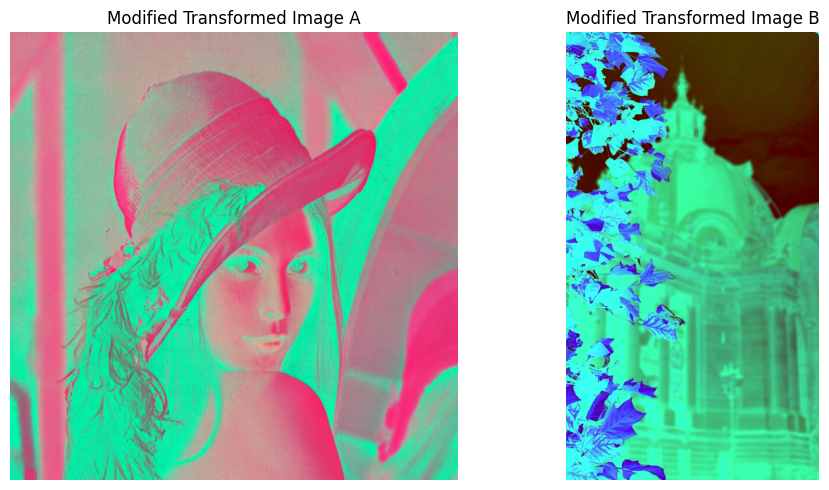

In [71]:
cv2.imwrite("out_img/4/modified_transformed_image_a.png", mod_trans_image_a)
cv2.imwrite("out_img/4/modified_transformed_image_b.png", mod_trans_image_b)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(mod_trans_image_a, cv2.COLOR_BGR2RGB))
plt.title('Modified Transformed Image A')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(mod_trans_image_b, cv2.COLOR_BGR2RGB))
plt.title('Modified Transformed Image B')
plt.axis('off')

plt.tight_layout()
plt.show()

### Subtask 6

Read transformed(A) and transformed(B) and mod_trans(A) and mod_trans(B)  and repeat subtask-3 (considering transformed(x) as input and mod_trans(x) as output)

In [72]:
transformed_image_a = cv2.imread("out_img/4/transformed_image_a.png")
modified_transformed_image_a = cv2.imread("out_img/4/modified_transformed_image_a.png")

transformed_image_b = cv2.imread("out_img/4/transformed_image_b.png")
modified_transformed_image_b = cv2.imread("out_img/4/modified_transformed_image_b.png")

trans_b_channel_a, trans_g_channel_a, trans_r_channel_a = cv2.split(transformed_image_a)
mod_trans_b_channel_a, mod_trans_g_channel_a, mod_trans_r_channel_a = cv2.split(modified_transformed_image_a)

trans_b_channel_b, trans_g_channel_b, trans_r_channel_b = cv2.split(transformed_image_b)
mod_trans_b_channel_b, mod_trans_g_channel_b, mod_trans_r_channel_b = cv2.split(modified_transformed_image_b)

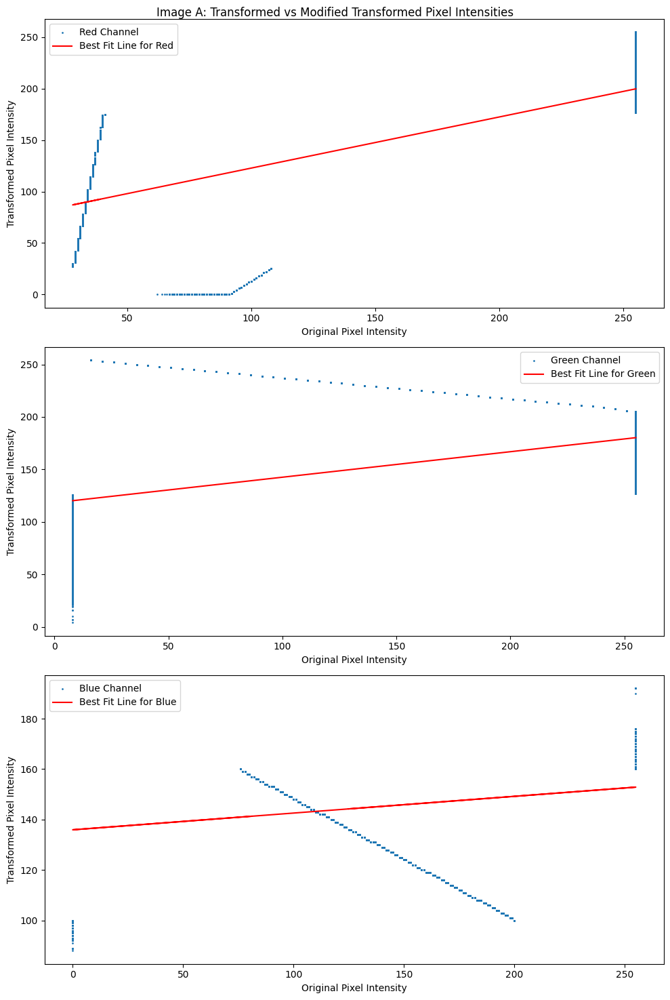

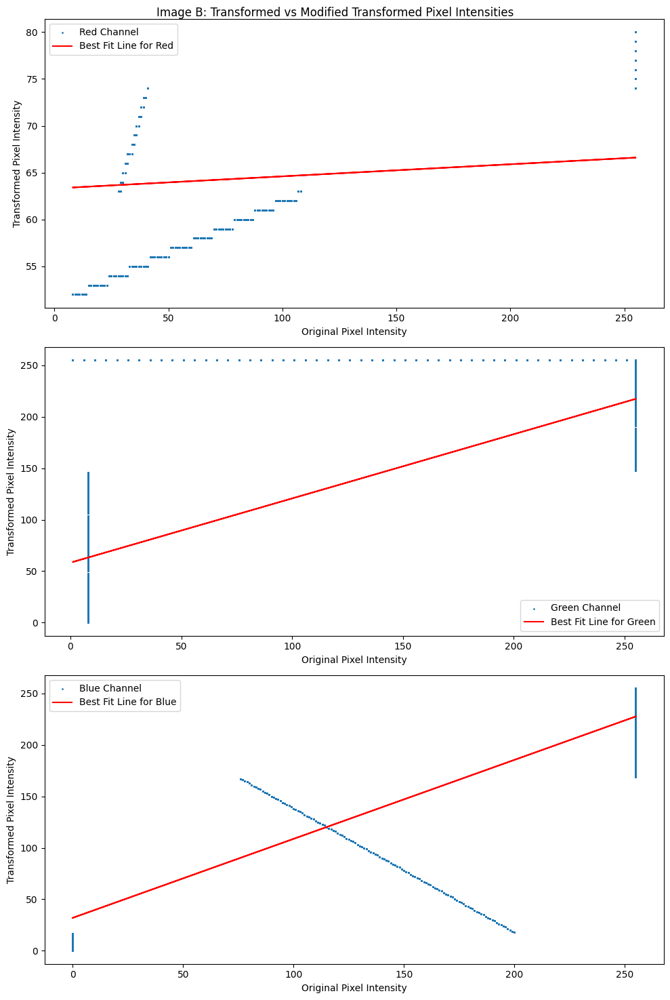

In [73]:
plt.figure(figsize=(10, 15))
plt.suptitle("Image A: Transformed vs Modified Transformed Pixel Intensities")

plt.subplot(3, 1, 1)
plot_channel_intensity_comparison(trans_r_channel_a, mod_trans_r_channel_a, "Red")

plt.subplot(3, 1, 2)
plot_channel_intensity_comparison(trans_g_channel_a, mod_trans_g_channel_a, "Green")

plt.subplot(3, 1, 3)
plot_channel_intensity_comparison(trans_b_channel_a, mod_trans_b_channel_a, "Blue")

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 15))
plt.suptitle("Image B: Transformed vs Modified Transformed Pixel Intensities")

plt.subplot(3, 1, 1)
plot_channel_intensity_comparison(trans_r_channel_b, mod_trans_r_channel_b, "Red")

plt.subplot(3, 1, 2)
plot_channel_intensity_comparison(trans_g_channel_b, mod_trans_g_channel_b, "Green")

plt.subplot(3, 1, 3)
plot_channel_intensity_comparison(trans_b_channel_b, mod_trans_b_channel_b, "Blue")

plt.tight_layout()
plt.show()

### Subtask 7

Lastly, look at transformed(x) and mod_trans(x) and comment what you think is the difference. Can this transformation be called a filter? 

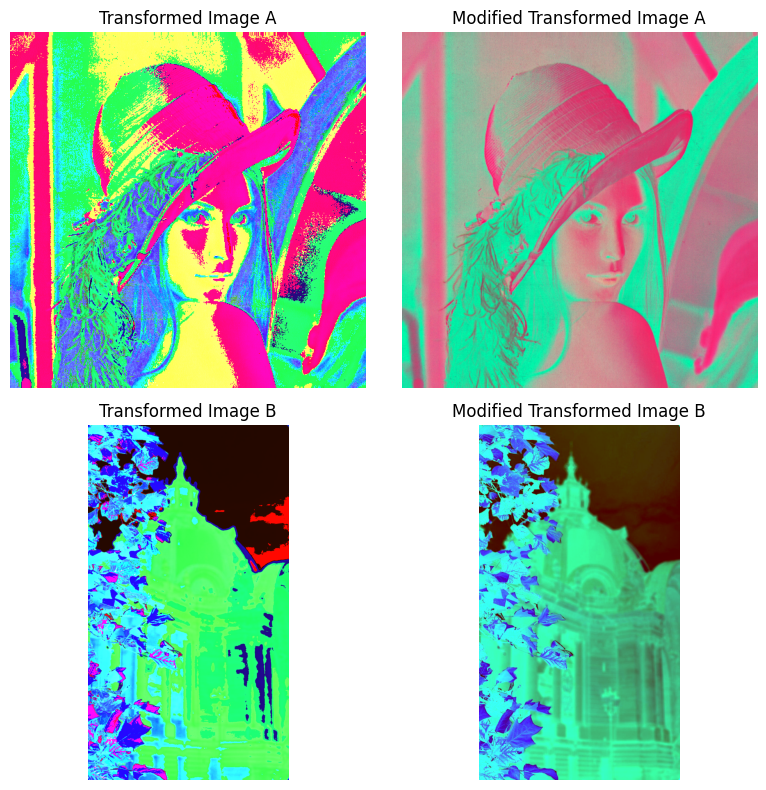

In [95]:
fig, axs = plt.subplots(2, 2, figsize=(8, 8))

axs[0, 0].imshow(cv2.cvtColor(transformed_image_a, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title("Transformed Image A")
axs[0, 0].axis("off")

axs[0, 1].imshow(cv2.cvtColor(modified_transformed_image_a, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title("Modified Transformed Image A")
axs[0, 1].axis("off")

axs[1, 0].imshow(cv2.cvtColor(transformed_image_b, cv2.COLOR_BGR2RGB))
axs[1, 0].set_title("Transformed Image B")
axs[1, 0].axis("off")

axs[1, 1].imshow(cv2.cvtColor(modified_transformed_image_b, cv2.COLOR_BGR2RGB))
axs[1, 1].set_title("Modified Transformed Image B")
axs[1, 1].axis("off")

fig.tight_layout()
plt.show()

#### Explanation

The initial transformation we did was a linear piece-wise transformation, which is essentially a non-linear operation. The line of best fit we calculated was a linear approximation of this non-linear transformation. The second half of this process thus involved applying this linear transformation, which could be seen as a filter. If the first transformation was also linear, then the overall process could be considered a filter. However, since the initial transformation was non-linear, the overall process is a combination of non-linear and linear operations, and thus may not be strictly called a filter.


---